In [155]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import re


In [156]:
ruta = "FINAL_MIAMI_RESTOS_GOOGLE-2.parquet"

In [157]:
df = pd.read_parquet(ruta)

In [158]:
df

,name_x,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,...,state,relative_results,url,user_id,name_y,time,rating,text,pics,resp
0,Honduras Nica Cafe,"Honduras Nica Cafe, 280 NW 79th St, Miami, FL 33150",0x88d9b176ea025e13:0x35d50186b9d6b2cc,None,25.847143,-80.202370,[Honduran restaurant],3.5,84,None,...,Closes soon ⋅ 9PM ⋅ Opens 7AM Fri,"[0x88d9b0d4f164e5b1:0xdcc57d188304c503, 0x88d9b202252f7bf3:0x259151b87893350b, 0x88d9b0d50ec7d1b1:0xcc91d7cd4b2008dc, 0x88d9b6d24edfd709:0xcd0d43b964197f08, 0x88d9b1bbc8e13c2b:0x4f88a2f839320877]",https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9b176ea025e13:0x35d50186b9d6b2cc?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
1,Eight Bistro Lounge,"Eight Bistro Lounge, 9851 NW 58th St, Doral, FL 33178",0x88d9bb7732788f7f:0xb16a74d70bd117e4,None,25.826451,-80.357219,[Restaurant],4.6,27,None,...,Open ⋅ Closes 1AM,"[0x88d9bb971f24ce8f:0x1fbcd4e9d1f694dd, 0x88d9b973cf840649:0x1b15f4bef5f3aa04, 0x88d9b95a9696cfed:0x5217d7eb9a8abbaa, 0x88d9bbdb8cae2b99:0x50d559b3c06ce689]",https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9bb7732788f7f:0xb16a74d70bd117e4?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
2,Jrk!,"Jrk!, 19565 Biscayne Blvd. Ste. FH10, Aventura, FL 33180",0x88d9ad0792a901dd:0x4f3b06ee355b64ce,None,25.957618,-80.142596,[Jamaican restaurant],4.5,58,None,...,Closes soon ⋅ 8PM ⋅ Opens 11AM Fri,None,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9ad0792a901dd:0x4f3b06ee355b64ce?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
4,MONALISA PIZERIA ITALIAN RESTAURANT,"MONALISA PIZERIA ITALIAN RESTAURANT, 4753 SW 8th St, Miami, FL 33134",0x88d9b7586c7923a5:0xa13568758d12b078,None,25.764368,-80.272756,[Italian restaurant],4.8,25,$$,...,Open ⋅ Closes 9PM,None,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9b7586c7923a5:0xa13568758d12b078?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
5,Filtafry,"Filtafry, 8865 SW 176th Terrace, Palmetto Bay, FL 33157",0x88d9c4390f3e7eab:0x3bb4bc555682b42f,None,25.606351,-80.335662,[Restaurant],3.3,3,None,...,None,None,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c4390f3e7eab:0x3bb4bc555682b42f?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8659,Wonder Wok,"Wonder Wok, 21313 NW 2nd Ave, Miami Gardens, FL 33169",0x88d9aebe6f7bb9fd:0x1904ac541b0350ce,None,25.970895,-80.205117,[Chinese restaurant],4.3,73,$,...,Open ⋅ Closes 10PM,"[0x88d9ac1c124a97b7:0x815187ba74c83ac9, 0x88d9aeb6855e2c61:0xb1dc2fb48245ef17, 0x88d9ac0947203a49:0xeeeefacbcecd9cac, 0x88d9ae5f035a47a5:0xabb9629b4479da11, 0x88d9ae7190f5a2c7:0xc038c82a16a22933]",https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9aebe6f7bb9fd:0x1904ac541b0350ce?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
8661,Costenos Seafood,"Costenos Seafood, Key Biscayne, FL 33149",0x88d9cb3656027bab:0x4042fc87cfb4e36a,None,25.704671,-80.154651,[Restaurant],4.4,14,None,...,Closes soon ⋅ 6PM ⋅ Opens 10AM Sun,None,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9cb3656027bab:0x4042fc87cfb4e36a?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
8662,Las Delicias Bakery,"Las Delicias Bakery, 610 E 9th St, Hialeah, FL 33010",0x88d9b0a24587ed5d:0x311f5266a29f0c22,None,25.830042,-80.269036,"[Bakery, Breakfast restaurant, Cuban restaurant, Dessert shop]",4.3,98,None,...,Open ⋅ Closes 8PM,"[0x88d9b0a12c40e8bb:0x35d91251969aedc5, 0x88d9b09efa003851:0x7cb27c287caa0c49, 0x88d9b08ef3cddfa1:0x796ca83599ee06f, 0x88d9b0a1aaab761d:0xc53c17aa2187a23f, 0x88d9b07f16b61037:0xf21b28a2daaaeefd]",https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9b0a24587ed5d:0x311f5266a29f0c22?authuser=-1&hl=en&gl=us,NaN,None,NaN,NaN,None,None,None
8663,Tango Grill,"Tango Grill, 401 Biscayne Blvd, Miami, FL 33132",0x88d9b42056d0d4ed:0x4da8a0499e26705e,None,25.777332,-80.185301,[Restaurant],3.6,18,None,...,None,"[0x88d9b4206eac1f39:0xd28

In [ ]:
# Convierte la columna de tiempo al formato de fecha y hora
df['time'] = pd.to_datetime(df['time'], unit='ms')

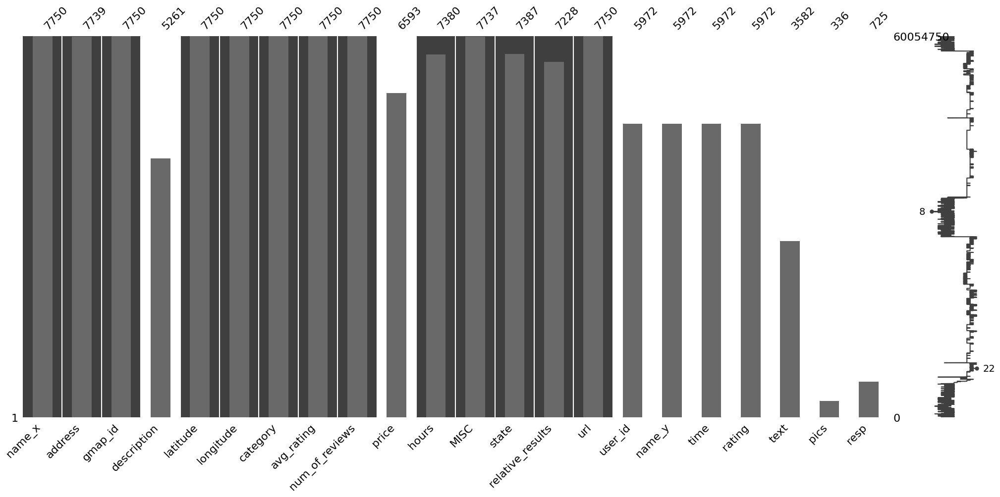

In [159]:
msno.matrix(df)
msno.bar(df)
plt.show()

In [160]:
df["url"][1087]

'https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c7be137a143d:0x912ae29e2919166b?authuser=-1&hl=en&gl=ae'

In [161]:
df["description"][1087]

'Tiny spot with a menu of creative Pan-Asian dishes plus wine, sake & a selection of bubble teas.'

In [162]:
df["gmap_id"].nunique()

1790

In [163]:
df.columns

Index(['name_x', 'address', 'gmap_id', 'description', 'latitude', 'longitude',
       'category', 'avg_rating', 'num_of_reviews', 'price', 'hours', 'MISC',
       'state', 'relative_results', 'url', 'user_id', 'name_y', 'time',
       'rating', 'text', 'pics', 'resp'],
      dtype='object')

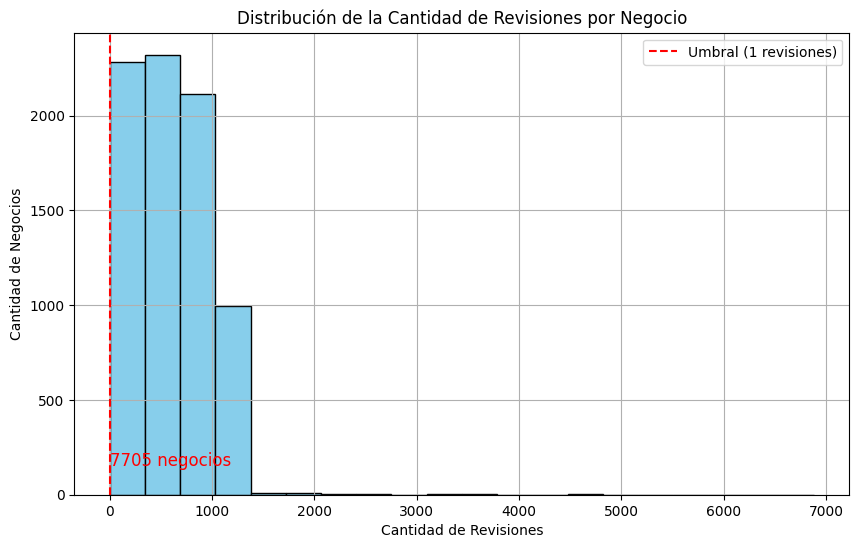

In [164]:
umbral_revisiones = 1

negocios_con_revisiones = df[df['num_of_reviews'] > umbral_revisiones]

cantidad_negocios_con_revisiones = len(negocios_con_revisiones)

plt.figure(figsize=(10, 6))
plt.hist(df['num_of_reviews'], bins=20, color='skyblue', edgecolor='black')
plt.axvline(x=umbral_revisiones, color='red', linestyle='--', label=f'Umbral ({umbral_revisiones} revisiones)')
plt.xlabel('Cantidad de Revisiones')
plt.ylabel('Cantidad de Negocios')
plt.title('Distribución de la Cantidad de Revisiones por Negocio')
plt.legend()
plt.grid(True)

plt.annotate(f'{cantidad_negocios_con_revisiones} negocios', (umbral_revisiones, 150), color='red', fontsize=12)
plt.show()

In [165]:
df["num_of_reviews"].head(30)

0      84
1      27
2      58
4      25
5       3
6      38
8       5
9      17
10     16
11     74
12     24
13     77
16      8
17      4
18      2
19      7
20     15
21     18
22     56
24     18
26     18
28    248
29      8
32     58
33     47
34     27
35      3
36     15
37    208
43     37
Name: num_of_reviews, dtype: int64

In [166]:
df_ordenado = df.sort_values(by='gmap_id')

In [167]:
#duplicados = df_ordenado[df_ordenado.duplicated(subset='gmap_id', keep=False)]

In [168]:
#duplicados

In [169]:
df['text'].fillna('', inplace=True)

# Define una función para obtener el sentimiento de un texto
def obtener_sentimiento(texto):
    analysis = TextBlob(texto)
    if analysis.sentiment.polarity > 0:
        return "Positivo"
    elif analysis.sentiment.polarity == 0:
        return "Neutral"
    else:
        return "Negativo"

# Aplica la función a la columna 'text' y crea una nueva columna 'sentimiento'
df['sentimiento'] = df['text'].apply(obtener_sentimiento)

In [170]:
df["sentimiento"].value_counts()

Neutral     4349
Positivo    3148
Negativo     253
Name: sentimiento, dtype: int64

In [171]:
pd.set_option('display.max_colwidth', None)
print(df["text"][4887])

Been here a hand full of times and each time was great....This past week brought my parents and daughter and my salad was awesome....Gal hooked it up and funniest thing we go a yogurt for my 1 year old daughter and she absolutely loved it...


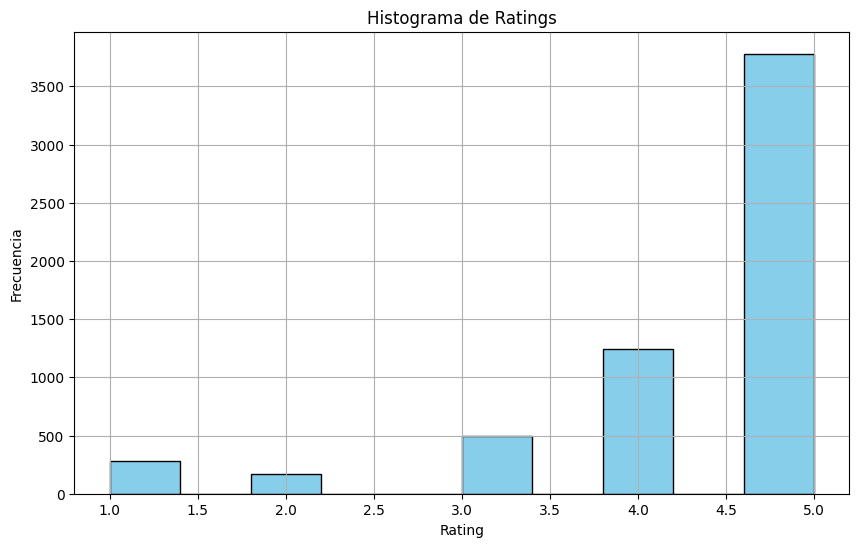

In [172]:
ratings = df['rating']

plt.figure(figsize=(10, 6))
plt.hist(ratings, bins=10, color='skyblue', edgecolor='black')
plt.xlabel('Rating')
plt.ylabel('Frecuencia')
plt.title('Histograma de Ratings')
plt.grid(True)

plt.show()

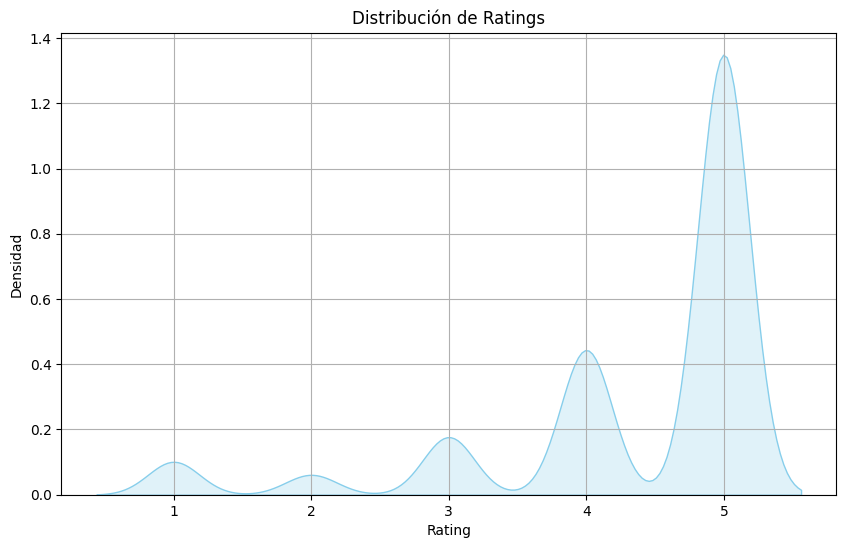

In [173]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df['rating'], color='skyblue', shade=True)
plt.xlabel('Rating')
plt.ylabel('Densidad')
plt.title('Distribución de Ratings')
plt.grid(True)

plt.show()

In [174]:
df["rating"].value_counts()

5.0    3780
4.0    1243
3.0     495
1.0     283
2.0     171
Name: rating, dtype: int64

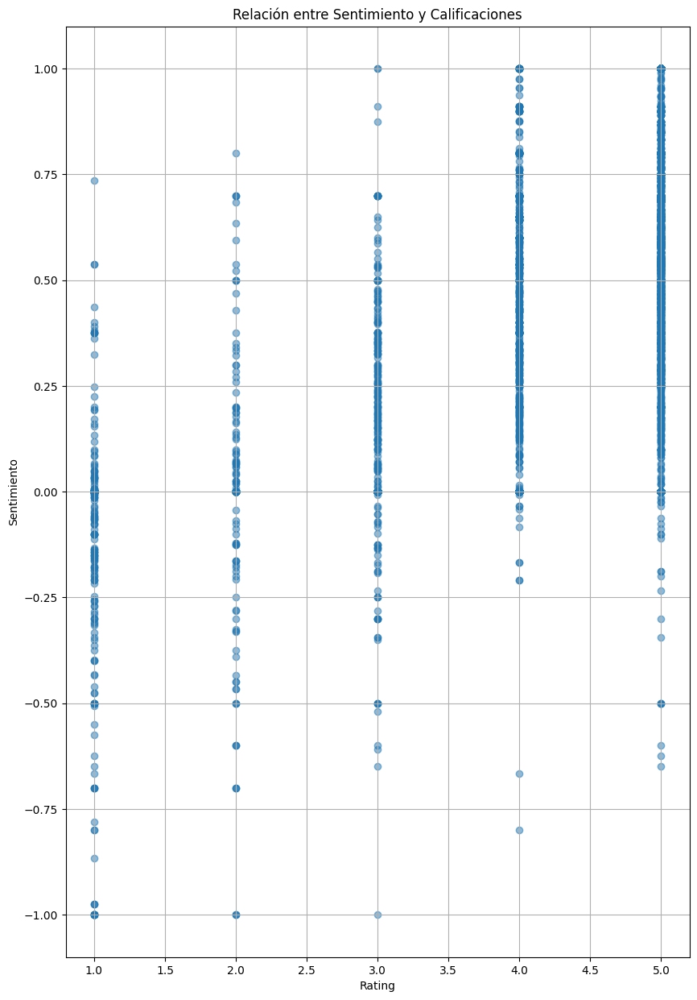

In [175]:
import pandas as pd
import matplotlib.pyplot as plt
from textblob import TextBlob

# Supongamos que ya tienes tu DataFrame cargado desde el archivo Parquet
# df = pd.read_parquet('archivo.parquet')

# Función para obtener el sentimiento de una revisión
def obtener_sentimiento(texto):
    analysis = TextBlob(texto)
    return analysis.sentiment.polarity

# Aplicar la función para calcular el sentimiento de cada revisión
df['sentimiento'] = df['text'].apply(obtener_sentimiento)

# Graficar la relación entre sentimiento y calificaciones
plt.figure(figsize=(10, 15))
plt.scatter(df['rating'], df['sentimiento'], alpha=0.5)
plt.xlabel('Rating')
plt.ylabel('Sentimiento')
plt.title('Relación entre Sentimiento y Calificaciones')
plt.grid(True)

# Mostrar el gráfico de dispersión
plt.show()


In [176]:
sentence_flair = df["text"][4887]

from flair.models import TextClassifier
from flair.data import Sentence

classifier = TextClassifier.load("en-sentiment")
sentence = Sentence('The food was great!')
classifier.predict(sentence)

print("La oracion es: ", sentence.labels)

RuntimeError: Failed to import transformers.trainer_utils because of the following error (look up to see its traceback):
dlopen(/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/_pywrap_tfe.so, 0x0002): Library not loaded: @rpath/_pywrap_tensorflow_internal.so
  Referenced from: <C29F3E3B-437B-31BE-AACD-F5A4AF56148B> /Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/_pywrap_tfe.so
  Reason: tried: '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../../_solib_darwin_x86_64/_U_S_Stensorflow_Spython_C_Upywrap_Utfe.so___Utensorflow/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../../_solib_darwin_x86_64/_U_S_Stensorflow_Spython_C_Upywrap_Utensorflow_Uinternal_Umacos___Utensorflow_Spython/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../../_solib_darwin_x86_64/_U_S_Stensorflow_Spython_C_Upywrap_Utfe.so___Utensorflow/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../../_solib_darwin_x86_64/_U_S_Stensorflow_Spython_C_Upywrap_Utensorflow_Uinternal_Umacos___Utensorflow_Spython/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/../_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/_pywrap_tensorflow_internal.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/Users/tinpenas/opt/anaconda3/lib/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/bin/../lib/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/lib/_pywrap_tensorflow_internal.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/Users/tinpenas/opt/anaconda3/lib/_pywrap_tensorflow_internal.so' (no such file), '/Users/tinpenas/opt/anaconda3/bin/../lib/_pywrap_tensorflow_internal.so' (no such file), '/usr/local/lib/_pywrap_tensorflow_internal.so' (no such file), '/usr/lib/_pywrap_tensorflow_internal.so' (no such file, not in dyld cache)

In [ ]:
df["price"].value_counts()

In [ ]:
copy = df.copy()

In [ ]:
mapping = {"₩": "$"}
copy["price"] = copy["price"].replace(mapping)

In [177]:
copy["price"].value_counts()

$$      3792
$       2779
$$$       18
$$$$       4
Name: price, dtype: int64

In [178]:
#funcion para ingresar en ETL

def replace_currency_symbol(value):
    if value is not None and "₩" in value:
        return value.replace("₩", "$")
    else:
        return value

df["price"] = df["price"].apply(replace_currency_symbol)

df["price"].value_counts()

$$      3792
$       2779
$$$       18
$$$$       4
Name: price, dtype: int64

In [179]:
# Función para asignar categorías de precio
def categorize_price(price):
    if price == '$':
        return 'Bajo'
    elif price == '$$':
        return 'Medio'
    elif price == '$$$':
        return 'Alto'
    elif price == '$$$$':
        return 'Muy Alto'
    else:
        return 'Desconocido'  # Maneja valores inesperados, si los hay

# Aplicar la función para crear la nueva columna 'price_category'
df['price_category'] = df['price'].apply(categorize_price)

In [180]:
df["price_category"].value_counts()

Medio          3792
Bajo           2779
Desconocido    1157
Alto             18
Muy Alto          4
Name: price_category, dtype: int64

<Figure size 1000x600 with 0 Axes>

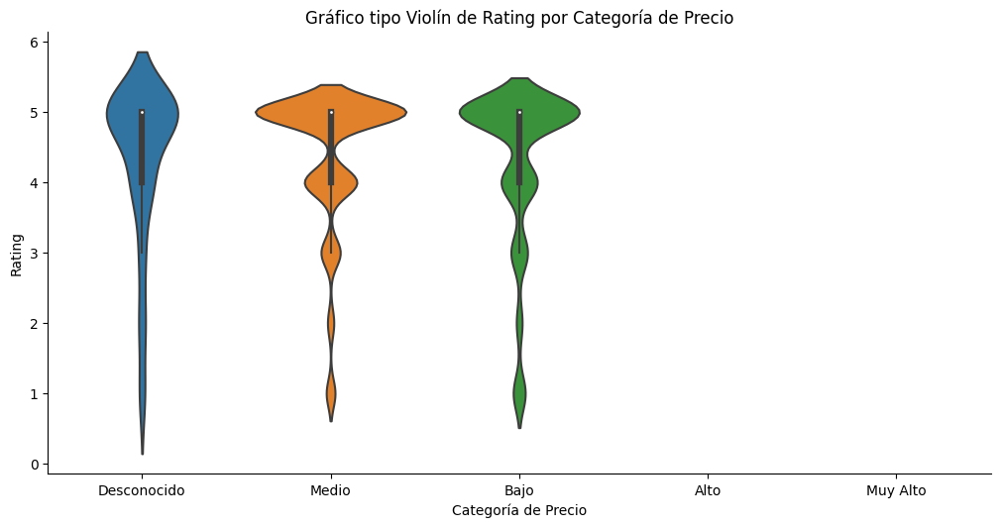

In [181]:
plt.figure(figsize=(10, 6))
sns.catplot(x = "price_category", y = "rating", data = df, kind = "violin", height=5, aspect=2)
plt.xlabel('Categoría de Precio')
plt.ylabel('Rating')
plt.title('Gráfico tipo Violín de Rating por Categoría de Precio')
plt.show()

La mayor cantidad de registros se encuentran entre los que no poseen categoría de precio, precio bajo y medio. Se puede observar tambien que los mayores puntajes se dan en el valor de rating 5.

In [182]:
dist_com = df["gmap_id"].value_counts()

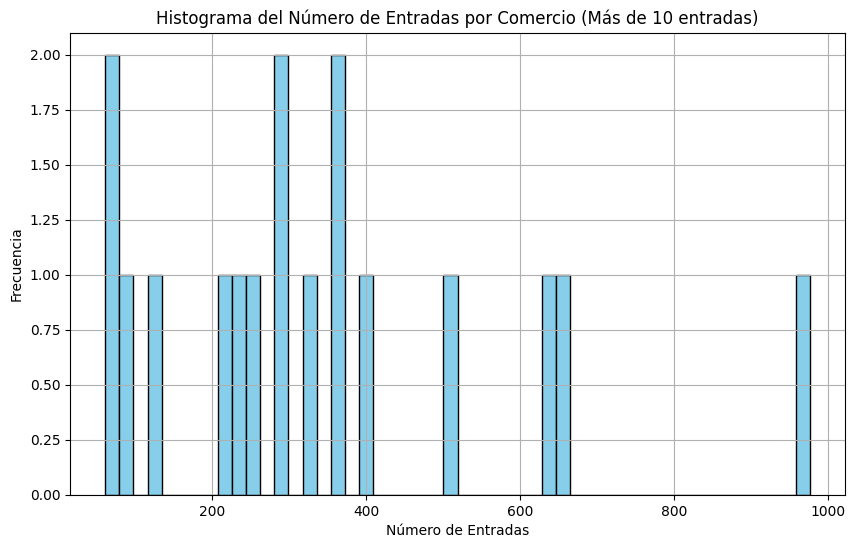

In [183]:
# Supongamos que 'dist_com' es tu DataFrame con los datos
# Filtra los comercios que tienen más de 10 entradas
comercios_mas_de_50_entradas = dist_com[dist_com > 50]

# Ahora, creemos el gráfico de bins con el número de entradas por comercio
plt.figure(figsize=(10, 6))
plt.hist(comercios_mas_de_10_entradas, bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Número de Entradas')
plt.ylabel('Frecuencia')
plt.title('Histograma del Número de Entradas por Comercio (Más de 10 entradas)')
plt.grid(True)

plt.show()

In [184]:
comercios_mas_de_50_entradas.describe()

count     17.000000
mean     342.529412
std      240.995622
min       61.000000
25%      209.000000
50%      291.000000
75%      399.000000
max      976.000000
Name: gmap_id, dtype: float64

In [185]:
comercios_mas_de_50_entradas.head(20)

0x88d9c112f2d5f76f:0xcef7e13f5e5abc6     976
0x88d9c0517c376183:0x865b60f41bcd7eb7    647
0x88d9bf8adfe37d87:0x5ce7f82266759ba8    637
0x88d9c050b7df9065:0x5794d1cf7c52c6a3    516
0x88d9c04e0e2036eb:0xc3bd5480cbaf8787    399
0x88d9c6942263e2a7:0x17d7e773157e45ea    359
0x88d9c7be137a143d:0x912ae29e2919166b    356
0x88d9bf9ecc0c5d55:0x4baa70e75ccfcd5a    328
0x88d9b9e3263c6b7f:0xee239d0e7111fe7     291
0x88d9b832792f58db:0x88719038b2311fcf    289
0x88d9a69ce34373f9:0x3f78709245d109a1    253
0x88d9b4f1f88c480f:0x8e7a9f439b7f6d7d    229
0x88d9b486679b9c39:0x9e75b794925dadc8    209
0x88d9b1c3a56d1da9:0x72b6666d71922ebf    117
0x88d9a5c11b2b9103:0x7256abaae3f706a5     90
0x88d9c33aa2cffdfd:0xf2ae5ee4e1ace603     66
0x88d9c0534d81a9e7:0x2fa0f9d718bd3445     61
Name: gmap_id, dtype: int64

In [186]:
index_com_mas_50 = comercios_mas_de_50_entradas.index

In [187]:
# Aplicar la máscara al DataFrame original 'df'
df_filtrado = df[df['gmap_id'].isin(index_com_mas_50)]

In [188]:
df_filtrado

,name_x,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,...,url,user_id,name_y,time,rating,text,pics,resp,sentimiento,price_category
435,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c6942263e2a7:0x17d7e773157e45ea?authuser=-1&hl=en&gl,1.024099e+20,lilly Ann,1.617561e+12,5.0,"The waitress Nathalie went above and beyond to make me feel welcomed. She walked me through the entire menu, specially helping me select the healthy options on the menu. Will definitely come back and bring friends! I felt like I was in Peru :)","[{'url': ['https://lh5.googleusercontent.com/p/AF1QipMXO1W4qXn392vBdXuXv9eNg8ndxtN6nQNdA5_4=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipP8TB9xg4MtlSbzQZAVoFDQLqPEWR6AgXJM36ty=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipNzYoCuw7yWWxTQaAup3x-T1Wawg0EZzK_H2l5J=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipNC9b1fPFO6VpZS8_QiayTqnj4pcL7DHlgifZLV=w150-h150-k-no-p']}]","{'text': 'Hello Lilly, Thanks for visiting us and give us your feedback. We hope to see you soon!!', 'time': 1618264707128.0}",0.193878,Medio
436,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c6942263e2a7:0x17d7e773157e45ea?authuser=-1&hl=en&gl,1.061489e+20,Carlos Benitez,1.623010e+12,5.0,Food was excellent better than their Flagler restaurant. Rolls were full not too much rice. sushi and rice were very fresh. Scarlett is amazing and extremely helpful. Definitely will be returning for more sushi in the future,None,"{'text': 'Hii Carlos, Thanks for visiting us and give us your feedback. We hope to see you very soon!!', 'time': 1623769085332.0}",0.341500,Medio
437,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c6942263e2a7:0x17d7e773157e45ea?authuser=-1&hl=en&gl,1.074704e+20,Angela Spann,1.616425e+12,4.0,"The food was delicious. The service could have been a lot better. There were 2 items on the menu, that they no longer carry...they should advise that, when you start looking. It took 5 minutes for me to finally decide what I wanted as an appetizer, to just find out that they no longer make it. 🙃","[{'url': ['https://lh5.googleusercontent.com/p/AF1QipPEkOlgkMDwqlBgia3uy5E5CSZ66Zp9Mgu0waBu=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipM-Ssobcxc52ANYK5lCrGbmWGqQk-o4R5QVaLt2=w150-h150-k-no-p']}]","{'text': 'Hello Angela, We are happy about your review, we will take your consideration. Hope to see you soon', 'time': 1618263197068.0}",0.500000,Medio
438,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,https://www.google.com/maps/place//data=!4m2!3m1!1s0x88d9c6942263e2a7:0x17d7e773157e45ea?authuser=-1&hl=en&gl,1.119457e+20,Arianne,1.623612e+12,5.0,"Oh my god. This place so underrated: food’s great, atmosphere is great, and our servers - Oscar, Scarlett, Fabi and Dayana - were amazing. Try the Crispy Chicken a la Juancaina 🤤 if you’re looking for drinks I recommend the Sake Mule."

In [199]:
index_com_mas_50 = index_com_mas_50.to_list()
index_com_mas_50

['0x88d9c112f2d5f76f:0xcef7e13f5e5abc6',
 '0x88d9c0517c376183:0x865b60f41bcd7eb7',
 '0x88d9bf8adfe37d87:0x5ce7f82266759ba8',
 '0x88d9c050b7df9065:0x5794d1cf7c52c6a3',
 '0x88d9c04e0e2036eb:0xc3bd5480cbaf8787',
 '0x88d9c6942263e2a7:0x17d7e773157e45ea',
 '0x88d9c7be137a143d:0x912ae29e2919166b',
 '0x88d9bf9ecc0c5d55:0x4baa70e75ccfcd5a',
 '0x88d9b9e3263c6b7f:0xee239d0e7111fe7',
 '0x88d9b832792f58db:0x88719038b2311fcf',
 '0x88d9a69ce34373f9:0x3f78709245d109a1',
 '0x88d9b4f1f88c480f:0x8e7a9f439b7f6d7d',
 '0x88d9b486679b9c39:0x9e75b794925dadc8',
 '0x88d9b1c3a56d1da9:0x72b6666d71922ebf',
 '0x88d9a5c11b2b9103:0x7256abaae3f706a5',
 '0x88d9c33aa2cffdfd:0xf2ae5ee4e1ace603',
 '0x88d9c0534d81a9e7:0x2fa0f9d718bd3445']

In [202]:
filtrado = df[df.gmap_id.isin(index_com_mas_50)]

In [203]:
filtrado

,name_x,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,...,user_id,name_y,time,rating,text,pics,resp,sentimiento,price_category,gmap_id_left
435,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,1.024099e+20,lilly Ann,1.617561e+12,5.0,"The waitress Nathalie went above and beyond to make me feel welcomed. She walked me through the entire menu, specially helping me select the healthy options on the menu. Will definitely come back and bring friends! I felt like I was in Peru :)","[{'url': ['https://lh5.googleusercontent.com/p/AF1QipMXO1W4qXn392vBdXuXv9eNg8ndxtN6nQNdA5_4=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipP8TB9xg4MtlSbzQZAVoFDQLqPEWR6AgXJM36ty=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipNzYoCuw7yWWxTQaAup3x-T1Wawg0EZzK_H2l5J=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipNC9b1fPFO6VpZS8_QiayTqnj4pcL7DHlgifZLV=w150-h150-k-no-p']}]","{'text': 'Hello Lilly, Thanks for visiting us and give us your feedback. We hope to see you soon!!', 'time': 1618264707128.0}",0.193878,Medio,0x88d9c6942263e2a7
436,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,1.061489e+20,Carlos Benitez,1.623010e+12,5.0,Food was excellent better than their Flagler restaurant. Rolls were full not too much rice. sushi and rice were very fresh. Scarlett is amazing and extremely helpful. Definitely will be returning for more sushi in the future,None,"{'text': 'Hii Carlos, Thanks for visiting us and give us your feedback. We hope to see you very soon!!', 'time': 1623769085332.0}",0.341500,Medio,0x88d9c6942263e2a7
437,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,1.074704e+20,Angela Spann,1.616425e+12,4.0,"The food was delicious. The service could have been a lot better. There were 2 items on the menu, that they no longer carry...they should advise that, when you start looking. It took 5 minutes for me to finally decide what I wanted as an appetizer, to just find out that they no longer make it. 🙃","[{'url': ['https://lh5.googleusercontent.com/p/AF1QipPEkOlgkMDwqlBgia3uy5E5CSZ66Zp9Mgu0waBu=w150-h150-k-no-p']}, {'url': ['https://lh5.googleusercontent.com/p/AF1QipM-Ssobcxc52ANYK5lCrGbmWGqQk-o4R5QVaLt2=w150-h150-k-no-p']}]","{'text': 'Hello Angela, We are happy about your review, we will take your consideration. Hope to see you soon', 'time': 1618263197068.0}",0.500000,Medio,0x88d9c6942263e2a7
438,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant, Small plates restaurant, Sushi restaurant, Wine bar]",4.3,554,$$,...,1.119457e+20,Arianne,1.623612e+12,5.0,"Oh my god. This place so underrated: food’s great, atmosphere is great, and our servers - Oscar, Scarlett, Fabi and Dayana - were amazing. Try the Crispy Chicken a la Juancaina 🤤 if you’re looking for drinks I recommend the Sake Mule.",None,"{'text': 'Hii Arianne, Thanks for visiting us and give us your feedback. We hope to see you very soon!!', 'time': 1623767950045.0}",0.400000,Medio,0x88d9c6942263e2a7
439,Sokai,"Sokai, 8888 SW 136th St #383, Miami, FL 33176",0x88d9c6942263e2a7:0x17d7e773157e45ea,None,25.643395,-80.336599,"[Japanese restaurant, Asian restaurant, Bar, Cocktail bar, Peruvian restaurant

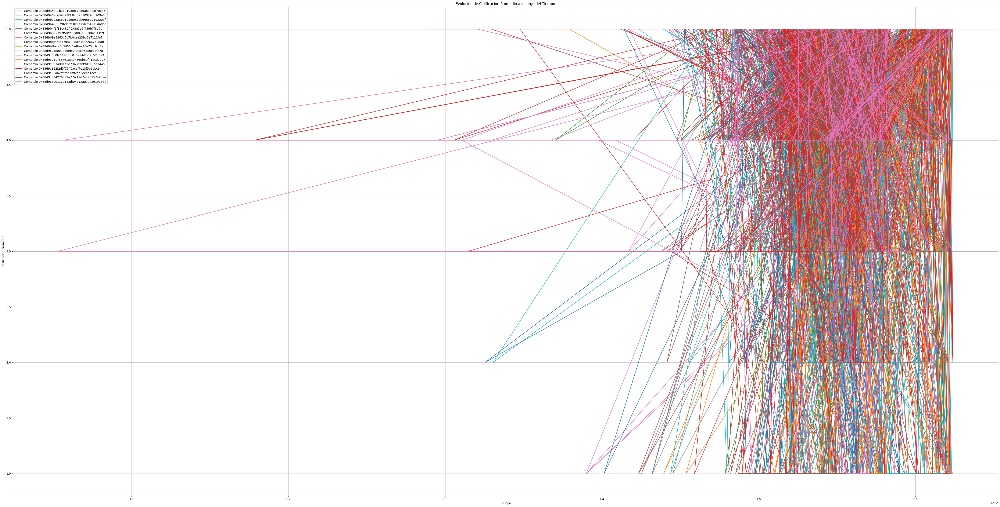

In [227]:
# Supongamos que 'df_filtrado' contiene tus datos filtrados

plt.figure(figsize=(60, 30))

for comercio, datos_comercio in filtrado.groupby('gmap_id'):
    plt.plot(datos_comercio['time'], datos_comercio['rating'], label=f'Comercio {comercio}')

plt.xlabel('Tiempo')
plt.ylabel('Calificación Promedio')
plt.title('Evolución de Calificación Promedio a lo largo del Tiempo')
plt.legend()
plt.grid(True)
plt.show()

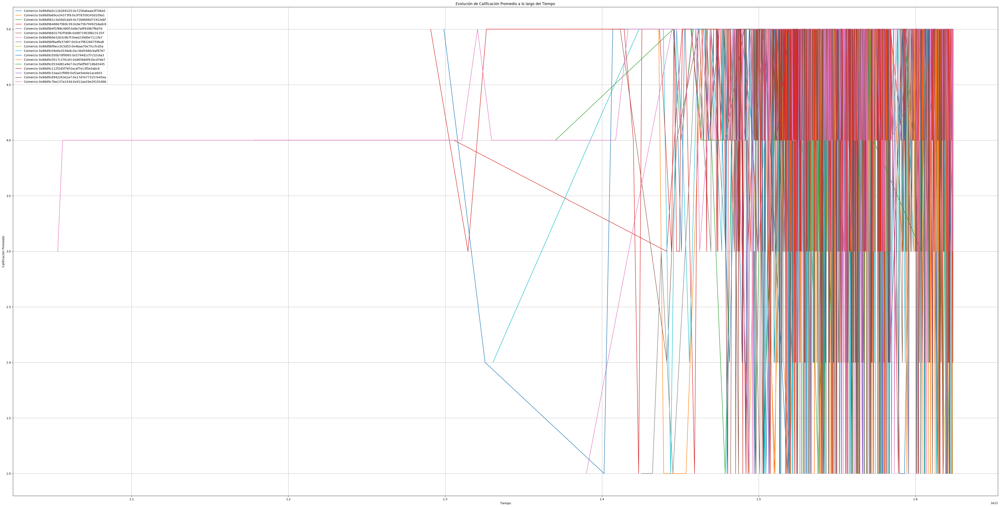

In [230]:
# Supongamos que 'df_filtrado' contiene tus datos filtrados

plt.figure(figsize=(60, 30))

# Ordena el DataFrame por la columna 'time'
df_filtrado = filtrado.sort_values(by='time')

for comercio, datos_comercio in df_filtrado.groupby('gmap_id'):
    plt.plot(datos_comercio['time'], datos_comercio['rating'], label=f'Comercio {comercio}')

plt.xlabel('Tiempo')
plt.ylabel('Calificación Promedio')
plt.title('Evolución de Calificación Promedio a lo largo del Tiempo')
plt.legend()
plt.grid(True)
plt.show()

In [220]:
filtrado1 = filtrado[filtrado["gmap_id"] == "0x88d9c112f2d5f76f:0xcef7e13f5e5abc6"]

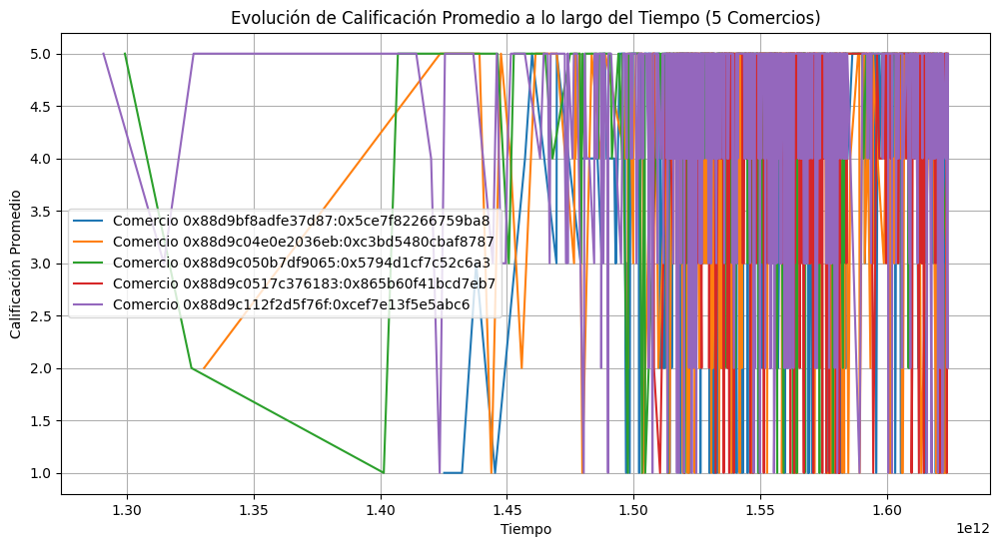

In [231]:
import matplotlib.pyplot as plt
import pandas as pd

# Supongamos que 'df_filtrado' contiene tus datos filtrados

plt.figure(figsize=(12, 6))

# Lista con los nombres de los 5 comercios que deseas graficar
comercios_a_graficar = [
    '0x88d9c112f2d5f76f:0xcef7e13f5e5abc6',
    '0x88d9c0517c376183:0x865b60f41bcd7eb7',
    '0x88d9bf8adfe37d87:0x5ce7f82266759ba8',
    '0x88d9c050b7df9065:0x5794d1cf7c52c6a3',
    '0x88d9c04e0e2036eb:0xc3bd5480cbaf8787'
]

# Filtra los datos solo para los 5 comercios seleccionados
df_comercios_seleccionados = df_filtrado[df_filtrado['gmap_id'].isin(comercios_a_graficar)]

# Ordena el DataFrame por la columna 'time'
df_comercios_seleccionados = df_comercios_seleccionados.sort_values(by='time')

for comercio, datos_comercio in df_comercios_seleccionados.groupby('gmap_id'):
    plt.plot(datos_comercio['time'], datos_comercio['rating'], label=f'Comercio {comercio}')

plt.xlabel('Tiempo')
plt.ylabel('Calificación Promedio')
plt.title('Evolución de Calificación Promedio a lo largo del Tiempo (5 Comercios)')
plt.legend()
plt.grid(True)
plt.show()